The kernel has to be restarted multiple times upon running the cells due to dependencies and libraries installation

In [1]:
!pip install tensorflow==2.8
!pip uninstall tensorflow-addons -y
!pip install tensorflow-addons

Found existing installation: tensorflow-addons 0.23.0
Uninstalling tensorflow-addons-0.23.0:
  Successfully uninstalled tensorflow-addons-0.23.0
  Using cached tensorflow_addons-0.23.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (1.8 kB)
Using cached tensorflow_addons-0.23.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (611 kB)


In [2]:
!pip install protobuf==3.20.*

Run the following cell and below after restarting kernel

In [3]:
pip install git+https://github.com/tensorflow/examples.git

  Cloning https://github.com/tensorflow/examples.git to /tmp/pip-req-build-nh4m43tu
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/examples.git /tmp/pip-req-build-nh4m43tu
  Resolved https://github.com/tensorflow/examples.git to commit 652ee34ff046946c36b8aed5d97ecebab0699f7e
  Preparing metadata (setup.py) ... done


Here's some guide for this assessment:

1. Obtain the dataset file from the assessment instruction.
2. The dataset file is split into image and label folder. You need to find a way to read all the images and labels as numpy array.
3. The most straight forward way to read an image is to use OpenCV (cv2.imread())
4. Resize your image and label into width and height of (128,128)
5. For the label, it is in the form of binary mask image (black and white image), you need to find a way to read the mask image, then process the value of the pixels so that they become class label ([0,255] --> [0,1])
6. You can perform train test split on the numpy arrays for the images and labels using scikit learn.
7. You can convert the numpy array into tensorflow tensors using this method: tf.data.Dataset.from_tensor_slices()
8. You can combine the images and labels together to form a single dataset using this method: tf.data.Dataset.zip(), do this for both train and test data.
9. Perform the same dataset preparation step as the demo.
10. Construct a UNet, then train this model so that it reaches at least 80% accuracy for both train and test.
11. Deploy the model and make prediction

(Hint: You can refer to the image segmentation tutorial from tensorflow)

In [4]:
# Zip File
!unzip "/content/data-science-bowl-2018.zip"

Archive:  /content/data-science-bowl-2018.zip
   creating: data-science-bowl-2018-2/
   creating: data-science-bowl-2018-2/test/
   creating: data-science-bowl-2018-2/test/inputs/
 extracting: data-science-bowl-2018-2/test/inputs/00071198d059ba7f5914a526d124d28e6d010c92466da21d4a04cd5413362552.png  
 extracting: data-science-bowl-2018-2/test/inputs/0532c64c2fd0c4d3188cc751cdfd566b1cfba3d269358717295bab1504c7c275.png  
 extracting: data-science-bowl-2018-2/test/inputs/06350c7cc618be442c15706db7a68e91f313758d224de4608f9b960106d4f9ca.png  
 extracting: data-science-bowl-2018-2/test/inputs/0d2bf916cc8de90d02f4cd4c23ea79b227dbc45d845b4124ffea380c92d34c8c.png  
  inflating: data-science-bowl-2018-2/test/inputs/0e5edb072788c7b1da8829b02a49ba25668b09f7201cf2b70b111fc3b853d14f.png  
  inflating: data-science-bowl-2018-2/test/inputs/0ea221716cf13710214dcd331a61cea48308c3940df1d28cfc7fd817c83714e1.png  
  inflating: data-science-bowl-2018-2/test/inputs/10328b822b836e67b547b4144e0b7eb43747c114ce4c

In [48]:
#1. Import packages
import tensorflow as tf
from tensorflow_examples.models.pix2pix import pix2pix
from IPython.display import clear_output
import matplotlib.pyplot as plt
import cv2
import numpy as np
import glob, os
from tensorflow import keras
from tensorflow.keras import layers, losses, models, optimizers, Sequential
from tensorflow.keras.models import Model
import tensorboard
import datetime
import tf_keras

%load_ext tensorboard
filepath = "/content/data-science-bowl-2018-2"
images = []
masks = []

ImportError: cannot import name 'dtensor' from 'tensorflow.compat.v2.experimental' (/usr/local/lib/python3.10/dist-packages/tensorflow/_api/v2/compat/v2/experimental/__init__.py)

In [6]:
#Use os.listdir() method to list down all the image file, then use a for loop to read the images.
"""
for ____ in os.listdir(____):
    function you will use here:
    os.path.join()
    cv2.imread()
    cv2.cvtColor()
    cv2.resize()

Use this for loop, do the same thing for the label. But I suggest you read the label as a grayscale image.
"""

#2. Load images
image_path = os.path.join(filepath,'train', 'inputs')
for img in os.listdir(image_path):
    #Get the full path of the image file
    full_path = os.path.join(image_path,img)
    #Read the image file based on the full path
    img_np = cv2.imread(full_path)
    #Convert the image from bgr to rgb
    img_np = cv2.cvtColor(img_np,cv2.COLOR_BGR2RGB)
    #Resize the image into 128x128
    img_np = cv2.resize(img_np,(128,128))
    #Place the image into the empty list
    images.append(img_np)

#3. Load masks
mask_path = os.path.join(filepath,'train', 'masks')
for mask in os.listdir(mask_path):
    #Get the full path of the mask file
    full_path = os.path.join(mask_path,mask)
    #Read the mask file as a grayscale image
    mask_np = cv2.imread(full_path,cv2.IMREAD_GRAYSCALE)
    #Resize the image into 128x128
    mask_np = cv2.resize(mask_np,(128,128))
    #Place the mask into the empty list
    masks.append(mask_np)

In [7]:
# check images and masks
print(images[0])
print(masks[0])

[[[15 15 15]
  [14 14 14]
  [16 16 16]
  ...
  [14 14 14]
  [15 15 15]
  [15 15 15]]

 [[15 15 15]
  [16 16 16]
  [16 16 16]
  ...
  [14 14 14]
  [14 14 14]
  [15 15 15]]

 [[15 15 15]
  [16 16 16]
  [15 15 15]
  ...
  [16 16 16]
  [14 14 14]
  [15 15 15]]

 ...

 [[16 16 16]
  [15 15 15]
  [15 15 15]
  ...
  [16 16 16]
  [16 16 16]
  [17 17 17]]

 [[16 16 16]
  [15 15 15]
  [16 16 16]
  ...
  [15 15 15]
  [16 16 16]
  [16 16 16]]

 [[16 16 16]
  [16 16 16]
  [16 16 16]
  ...
  [17 17 17]
  [16 16 16]
  [15 15 15]]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [8]:
#4. Convert the list of np array into a full np array
images_np = np.array(images)
masks_np = np.array(masks)

In [9]:
# check images and masks
print(images_np.shape)
print(masks_np.shape)

(603, 128, 128, 3)
(603, 128, 128)


In [10]:
#5. Data preprocessing
#5.1. Expand the mask dimension to include the channel axis
masks_np_exp = np.expand_dims(masks_np,axis=-1)
#5.2. Convert the mask value into just 0 and 1
converted_masks_np = np.round(masks_np_exp/255)
#5.3. Normalize the images pixel value
normalized_images_np = images_np/255.0

print(masks_np_exp.shape)

(603, 128, 128, 1)


both images and masks have 603 batches (total images) altogether, with size 128 x 128 and RGB for images (masks initially dont have last dimension bcs it is only black and white)

In [11]:
#6. Perform train test split
from sklearn.model_selection import train_test_split
SEED = 12345
X_train,X_test,y_train,y_test = train_test_split(normalized_images_np,converted_masks_np,shuffle=True,random_state=SEED)

In [12]:
# print shape of each split
print("Train: ", X_train.shape, y_train.shape)
print("Test: ", X_test.shape, y_test.shape)

Train:  (452, 128, 128, 3) (452, 128, 128, 1)
Test:  (151, 128, 128, 3) (151, 128, 128, 1)


In [13]:
#7. Convert the numpy array into tensorflow tensors
X_train_tensor = tf.data.Dataset.from_tensor_slices(X_train)
X_test_tensor = tf.data.Dataset.from_tensor_slices(X_test)
y_train_tensor = tf.data.Dataset.from_tensor_slices(y_train)
y_test_tensor = tf.data.Dataset.from_tensor_slices(y_test)

In [14]:
print("Train: ", X_train_tensor.element_spec.shape, y_train_tensor.element_spec.shape)
print("Test: ", X_test_tensor.element_spec.shape, y_test_tensor.element_spec.shape)

Train:  (128, 128, 3) (128, 128, 1)
Test:  (128, 128, 3) (128, 128, 1)


In [15]:
#8. Combine features and labels together to form a zip dataset
train = tf.data.Dataset.zip((X_train_tensor,y_train_tensor))
test = tf.data.Dataset.zip((X_test_tensor,y_test_tensor))

In [16]:
# print first set of train (a pair of image and masks)
print((list(train.as_numpy_iterator()))[0])

(array([[[0.10196078, 0.10196078, 0.10196078],
        [0.12156863, 0.12156863, 0.12156863],
        [0.13333333, 0.13333333, 0.13333333],
        ...,
        [0.1372549 , 0.1372549 , 0.1372549 ],
        [0.14117647, 0.14117647, 0.14117647],
        [0.14509804, 0.14509804, 0.14509804]],

       [[0.09803922, 0.09803922, 0.09803922],
        [0.10980392, 0.10980392, 0.10980392],
        [0.12156863, 0.12156863, 0.12156863],
        ...,
        [0.14117647, 0.14117647, 0.14117647],
        [0.15294118, 0.15294118, 0.15294118],
        [0.15294118, 0.15294118, 0.15294118]],

       [[0.09803922, 0.09803922, 0.09803922],
        [0.10980392, 0.10980392, 0.10980392],
        [0.11764706, 0.11764706, 0.11764706],
        ...,
        [0.1372549 , 0.1372549 , 0.1372549 ],
        [0.14901961, 0.14901961, 0.14901961],
        [0.15294118, 0.15294118, 0.15294118]],

       ...,

       [[0.03137255, 0.03137255, 0.03137255],
        [0.02745098, 0.02745098, 0.02745098],
        [0.03137255, 

In [17]:
"""
Continue the rest of your assessment here.
"""
#Convert the zip dataset into prefetch dataset

train = train.prefetch(buffer_size=tf.data.AUTOTUNE)
test = test.prefetch(buffer_size=tf.data.AUTOTUNE)

print(train.element_spec)
print(test.element_spec)

(TensorSpec(shape=(128, 128, 3), dtype=tf.float64, name=None), TensorSpec(shape=(128, 128, 1), dtype=tf.float64, name=None))
(TensorSpec(shape=(128, 128, 3), dtype=tf.float64, name=None), TensorSpec(shape=(128, 128, 1), dtype=tf.float64, name=None))


In [18]:
# batching first then only augment
BATCH_SIZE = 64
BUFFER_SIZE = 1000 # BUFFER_SIZE must > Data Size for perfect shuffling (uniformly distributed)

# 1. cache keeps the images in memory after they're loaded off disk during the first epoch.
# 2. Randomly shuffles the elements of this dataset.
# 3. Split into batches
# 4. If we don't want to mix data from different epochs in one batch, we need to put repeat after batch. repeat simply replicate the data
# some argue that the best order is shuffle-repeat-batch. according to keras .fit() method, it is shuffle-batch-repeat, as long as we pass reshuffle_each_iteration=True in shuffle
# 5. prefetch since batching transform into BatchDataset type, but we can do this after augmentation other wise need to call prefetch multiple calls
train = train.cache().shuffle(buffer_size=BUFFER_SIZE, seed=SEED, reshuffle_each_iteration=True).batch(BATCH_SIZE).prefetch(buffer_size=tf.data.AUTOTUNE)
test = test.batch(batch_size=BATCH_SIZE).prefetch(buffer_size=tf.data.AUTOTUNE)

In [19]:
print(type(train))

<class 'tensorflow.python.data.ops.dataset_ops.PrefetchDataset'>


In [20]:
def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()

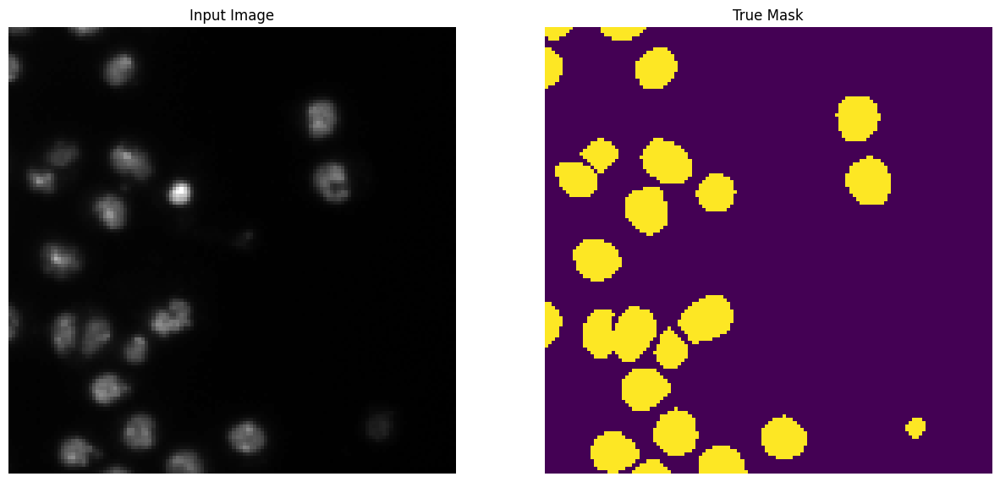

In [21]:
# visualise a sample of image and mask
for images, masks in train.take(1):
  sample_image, sample_mask = images[0], masks[0]
  display([sample_image, sample_mask])

In [22]:
# Data Augmentation - I use function instead of layers because saving augmentation layers are non-serialisable, will create trouble during saving into hdf5 formay (unless saving to .keras)
# in the documentation of tf data augmentation, it is stated that we should use tf.image_stateless_random instead of tf.image.random
from tensorflow.keras.preprocessing.image import random_rotation, random_brightness
import tensorflow_addons as tfa
def data_augmentation_function(image, mask, seed):
    # Augment the image
    image = tf.image.stateless_random_flip_left_right(image, seed=seed)
    angles = tf.random.stateless_uniform([], minval=-20, maxval=20, seed=seed)
    image = tfa.image.rotate(image, angles, interpolation='BILINEAR')
    image = tf.image.stateless_random_brightness(image, max_delta=0.2, seed=seed)
    image = tf.image.stateless_random_contrast(image, lower=0.8, upper=1.2, seed=seed)

    # Add Gaussian noise to the image
    noise = tf.random.stateless_normal(shape=tf.shape(image), mean=0.0, stddev=0.05, seed=seed)
    image = tf.clip_by_value(image + noise, 0.0, 1.0)

    # Augment the mask
    mask = tf.image.stateless_random_flip_left_right(mask, seed=seed)
    mask = tfa.image.rotate(mask, angles, interpolation='NEAREST')

    # Ensure consistent size after augmentation
    image = tf.image.resize(image, (128, 128))
    mask = tf.image.resize(mask, (128, 128), method='nearest')

    return image, mask


# Preprocessing pipeline for dataset
def preprocess_and_augment(image, mask):
    image = tf.cast(image, tf.float32) / 255.0
    mask = tf.cast(mask, tf.int32)
    seed = tf.random.uniform([2], minval=0, maxval=1000000, dtype=tf.int32)
    # Apply augmentation
    image, mask = data_augmentation_function(image, mask, seed)
    return image, mask



/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.13.0 and strictly below 2.16.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.8.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're us

In [23]:
print(train.take(2))

<TakeDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float64, name=None), TensorSpec(shape=(None, 128, 128, 1), dtype=tf.float64, name=None))>


(128, 128, 3) (128, 128, 1)


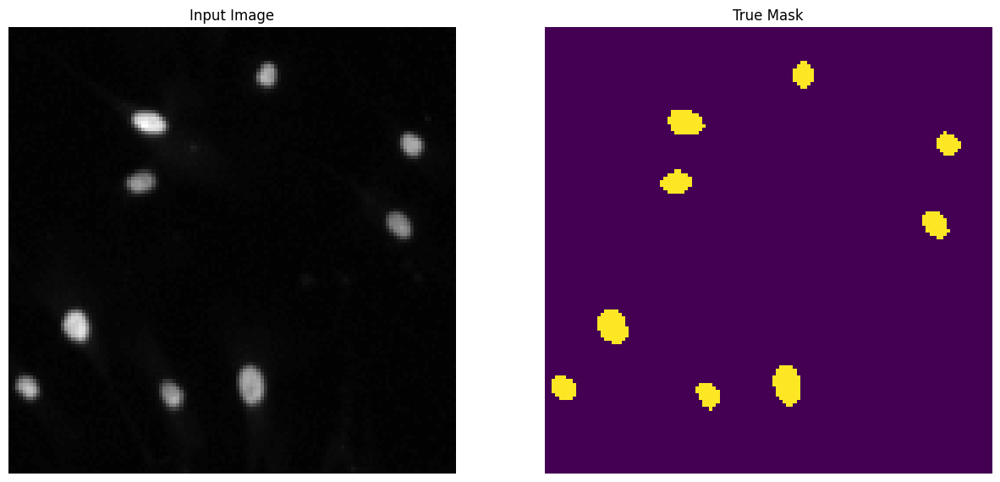

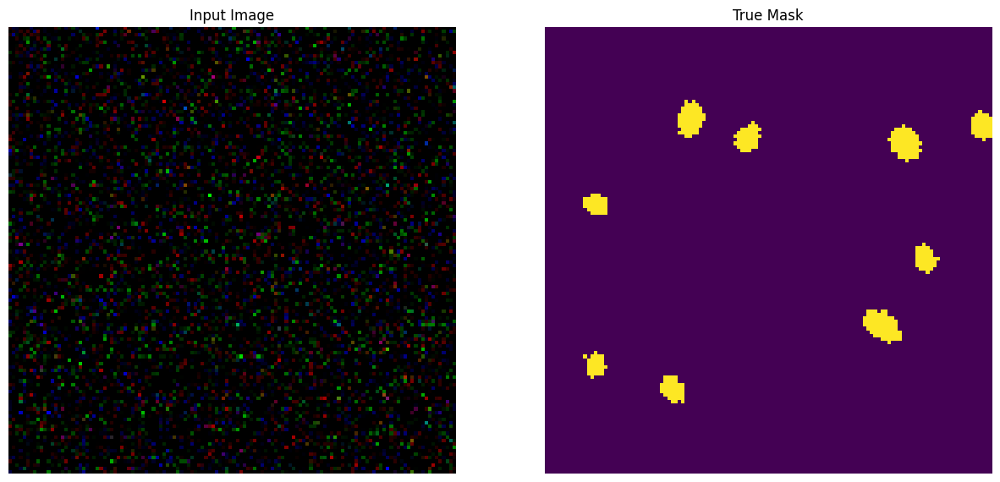

In [24]:
# visualise a sample of image and mask
for images, masks in train.take(1):
  sample_image, sample_mask = images[0], masks[0]


  # Use the same seed for both image and mask augmentation
  seed = (23, 0)
  augmented_image, augmented_mask = preprocess_and_augment(sample_image, sample_mask)
  print(augmented_image.shape, augmented_mask.shape)

  # to compare original and after augmentation
  display([sample_image, sample_mask])
  display([augmented_image, augmented_mask])

In [25]:
# Modify dataset pipeline
train_dataset = train.map(preprocess_and_augment, num_parallel_calls=tf.data.AUTOTUNE)
print(train_dataset.element_spec)

(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 128, 128, 1), dtype=tf.int32, name=None))


In [26]:
# Implement U-Net (comprises of encoder and decoder)

# the encoder is a pretrained MobileNetV2 model.
# We will use the model from tf.keras.applications.
# The encoder consists of specific outputs from intermediate layers in the model.
# Note that the encoder will not be trained during the training process.

base_model = tf.keras.applications.MobileNetV2(input_shape=[128, 128, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)

down_stack.trainable = False

9420800/9406464 [==============================] - 0s 0us/step


In [27]:
# The decoder/upsampler is simply a series of upsample blocks implemented in TensorFlow examples
up_stack = [
    pix2pix.upsample(256, 3),  # reduce filter
    pix2pix.upsample(128, 3),  # 8x8 -> 16x16
    pix2pix.upsample(64, 3),  # 16x16 -> 32x32
    pix2pix.upsample(32, 3),   # 32x32 -> 64x64
]

In [28]:
# Building the model
def unet_model(output_channels:int):
  inputs = tf.keras.layers.Input(shape=[128, 128, 3])

  # Downsampling through the encoder
  skips = down_stack(inputs)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = tf.keras.layers.Dropout(0.3)(x)  # Drop 30% of neurons
    x = up(x)

    # [Finetuning]
    # Add BatchNormalization and ReLU
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)

    concat = tf.keras.layers.Concatenate()

    x = concat([x, skip])

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(
       filters=output_channels, kernel_size=3, strides=2,
       padding='same')  #64x64 -> 128x128 # since we are using sparse_categorical_cross_entropy

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [29]:
# Training the model
OUTPUT_CLASSES = 2 # background and foreground

model = unet_model(output_channels=OUTPUT_CLASSES)
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

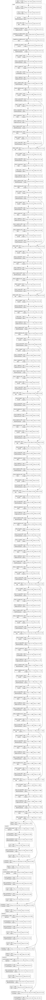

In [30]:
tf.keras.utils.plot_model(model, show_shapes=True, expand_nested=True, dpi=64)

In [31]:
# for example to check shape
for image, mask in test.take(1):
      pred_mask = model.predict(image)
      print(pred_mask.shape)

(64, 128, 128, 2)


In [32]:
def create_mask(pred_mask):
  pred_mask = tf.math.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  # print(pred_mask)
  return pred_mask

def show_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)[0]])
  else:
    display([sample_image, sample_mask,
             create_mask(model.predict(sample_image[tf.newaxis, ...]))])

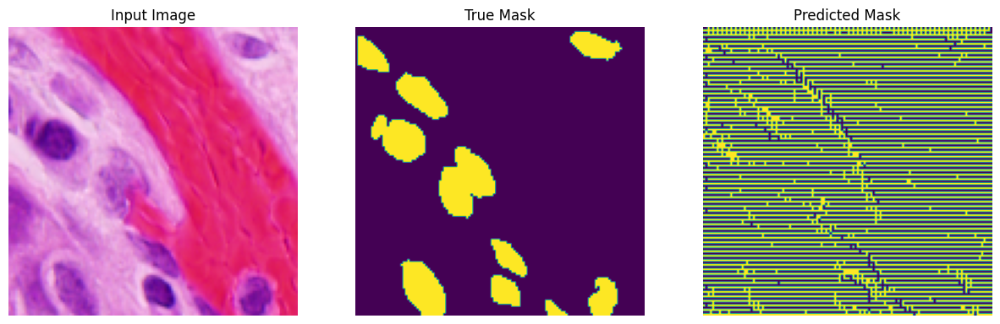

In [33]:
# before training we check how good it is in predicting the mask
show_predictions(test,1)

In [34]:
class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    clear_output(wait=True)
    show_predictions(test)
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

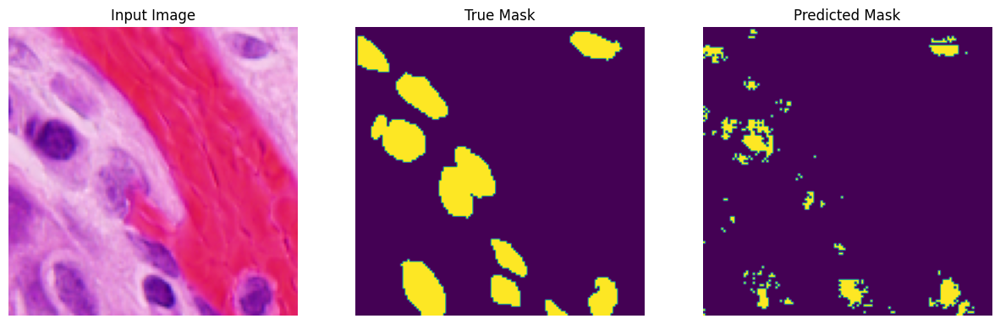


Sample Prediction after epoch 10

8/8 [==============================] - 36s 5s/step - loss: 0.1449 - accuracy: 0.9408 - val_loss: 0.1747 - val_accuracy: 0.9159


In [35]:
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

EPOCHS = 10
# remove tf.data.experimental.cardinality(train).numpy() if infinte dataset
model_history = model.fit(train, epochs=EPOCHS,
                          validation_data=test,
                          callbacks=[DisplayCallback(), keras.callbacks.EarlyStopping(patience=2, verbose=1), tensorboard_callback])

In [36]:
%tensorboard --logdir logs/fit


<IPython.core.display.Javascript object>

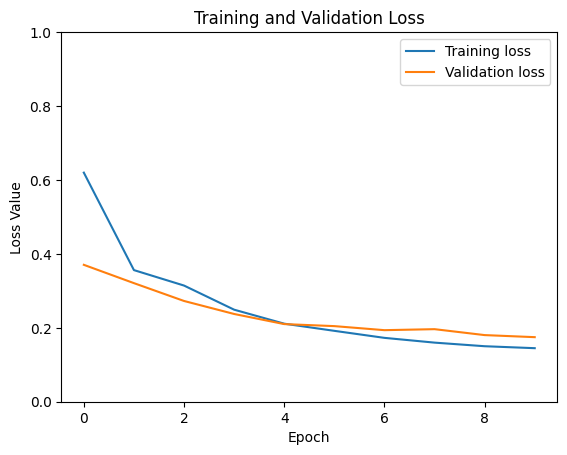

In [37]:
loss = model_history.history['loss']
val_loss = model_history.history['val_loss']

plt.figure()
plt.plot(model_history.history['loss'], label='Training loss')
plt.plot(model_history.history['val_loss'], label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.legend()
plt.show()

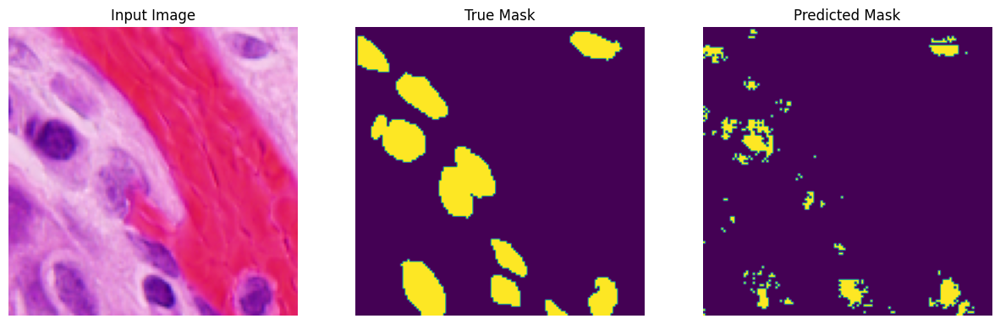

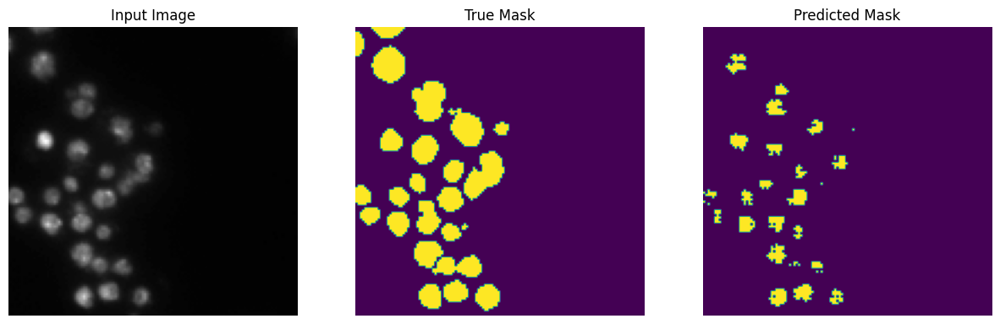

In [38]:
# run prediction on test
show_predictions(test, 2)

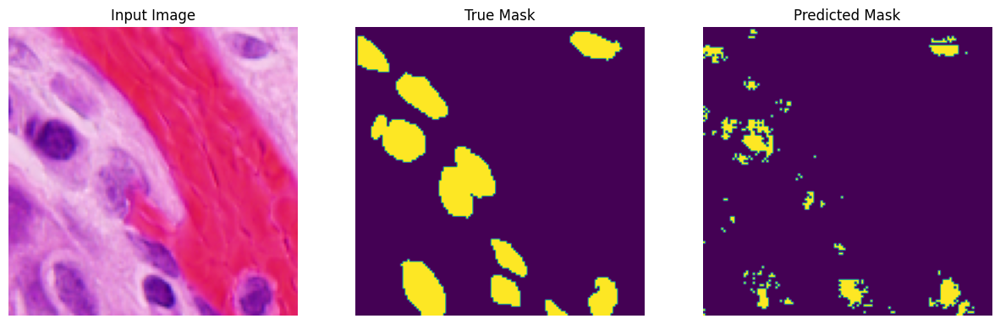

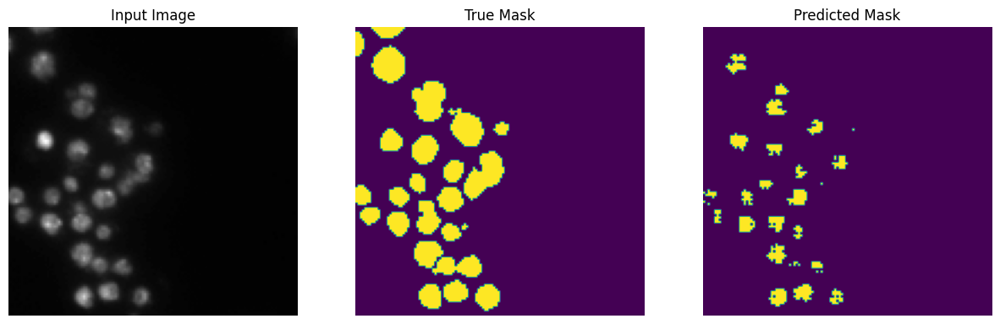

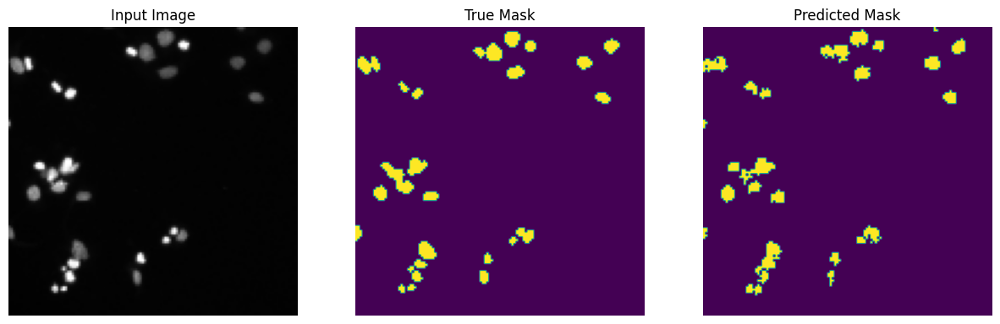

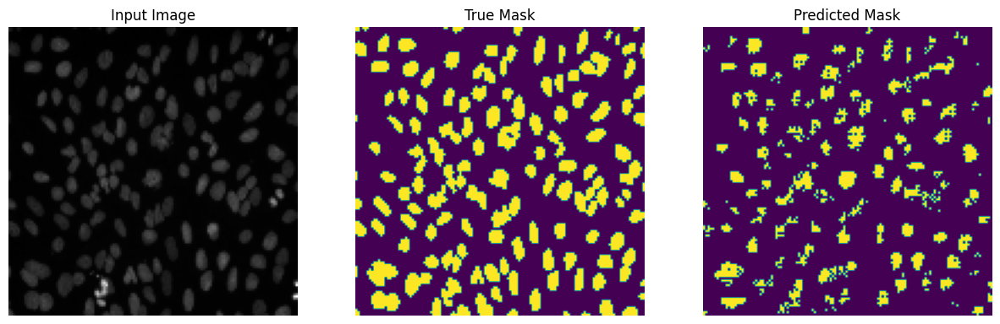

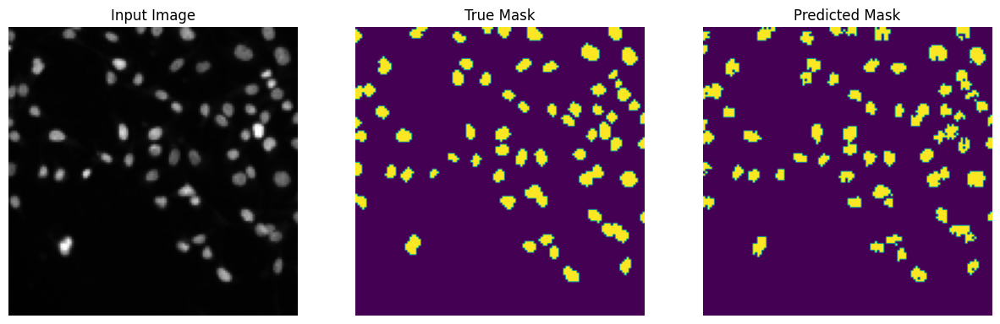

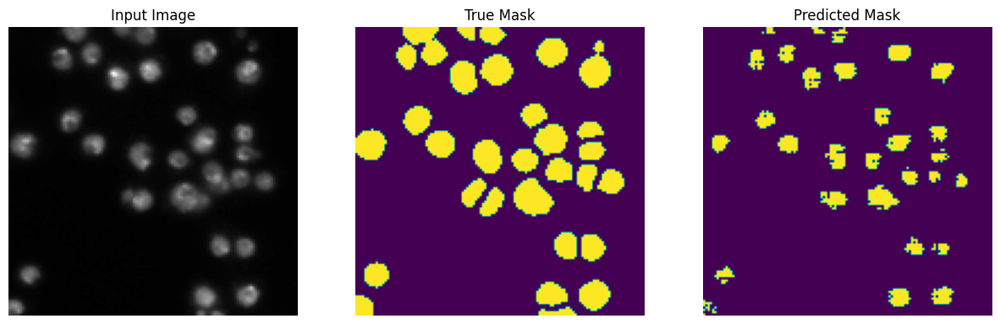

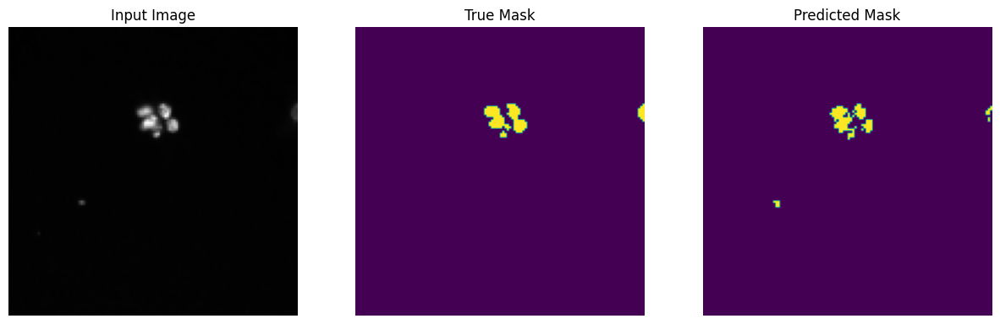

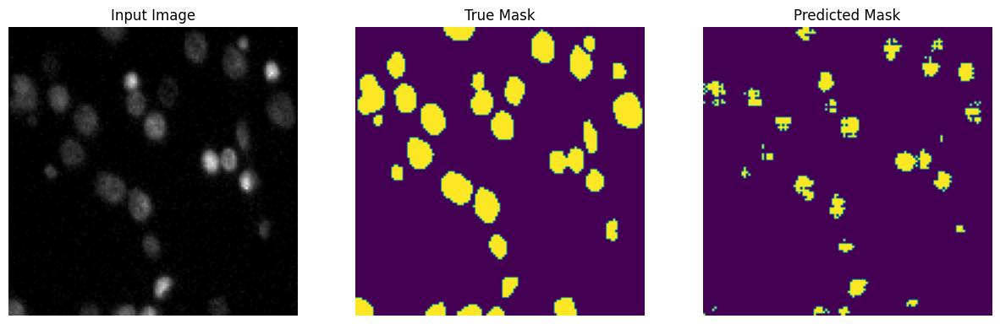

In [46]:
for i in range(4):
    for image_batch, mask_batch in test.take(1):
        pred_mask = model.predict(image_batch)  # predict for the entire batch
        display([
            image_batch[i],
            mask_batch[i],
            create_mask(pred_mask[i])
        ])


In [40]:
model.evaluate(test)

3/3 [==============================] - 4s 1s/step - loss: 0.1747 - accuracy: 0.9159


[0.1746719628572464, 0.9159343838691711]

In [41]:
pred_mask = model.predict(test)
print(f"Shape of predicted mask: {pred_mask.shape}")
print(f"Unique values in predicted mask: {np.unique(pred_mask)}")


Shape of predicted mask: (151, 128, 128, 2)
Unique values in predicted mask: [-5.13467   -5.1345935 -5.050402  ...  5.258191   5.3736954  5.3887043]


In [50]:
model.save('model.h5')
model.save('model.keras') # in keras


In [52]:
#testing loading model
loaded_model = keras.models.load_model('model.h5')